In [3]:
import os
import time
import torch
import numpy as np
from PIL import Image
import requests
import torchvision.transforms as T
from collections import defaultdict
# import torch.nn.functional as F

# from skimage.measure import find_contours
# import cv2
# import tqdm

import matplotlib.pyplot as plt
from matplotlib import patches,  lines
from matplotlib.patches import Polygon

In [8]:
# %load_ext tensorboard

In [9]:
# from torch.utils.tensorboard import SummaryWriter
# writer = SummaryWriter('logs/mdetr_efficientnetB5')

In [10]:
# %tensorboard --logdir logs

In [11]:
transform = T.Compose([
    T.Resize(500),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [12]:
model, postprocessor = torch.hub.load('ashkamath/mdetr:main', 'mdetr_efficientnetB5', pretrained=True, return_postprocessor=True)

Using cache found in /Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main
Some weights of the model checkpoint at roberta-base were not used when initializing RobertaModel: ['lm_head.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias', 'lm_head.bias', 'lm_head.decoder.weight', 'lm_head.dense.bias']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [13]:
# import torch.nn as nn
# class MDetr(nn.Module):
#     def __init__(self, model, captions):
#         super().__init__()
#         self.mdetr = model
#         self.captions = captions
        
#     def forward(self, img):
#         cache = self.mdetr(img, self.captions)
#         return cache['img_memory']
#         # outputs = self.mdetr(img, [self.captions], encode_and_save=False, memory_cache=memory_cache)
#         # return outputs['pred_logits'], outputs['pred_boxes']
    
# # {'pred_logits': torch.Size([1, 100, 256]),
# #  'pred_boxes': torch.Size([1, 100, 4]),
# #  'proj_queries': torch.Size([1, 100, 64]),
# #  'proj_tokens': torch.Size([1, 28, 64]),
# #  'tokenized': transformers.tokenization_utils_base.BatchEncoding}
# model_wrap = MDetr(model, [caption])

In [14]:
# img = Image.open('cookbook/1-jelly-000.jpg')
# X_img = transform(img).unsqueeze(0)
# writer.add_graph(model_wrap, X_img, True, use_strict_trace=False)

In [15]:
# import torchviz
# img = Image.open('cookbook/1-jelly-000.jpg')
# X_img = transform(img).unsqueeze(0)
# memory_cache = model(X_img, [caption], encode_and_save=True)
# outputs = model(X_img, [caption], encode_and_save=False, memory_cache=memory_cache)
# torchviz.make_dot(outputs['pred_logits'], params=dict(model.named_parameters()))

In [16]:
def monkey(obj):
    def inner(func):
        name = func.__name__
        backup_name = f'_backup_{name}'
        meth = getattr(obj, backup_name, None) or getattr(obj, name)
        setattr(obj, backup_name, meth)
        
        def inner(*a, **kw):
            return func(meth, *a, **kw)
        setattr(obj, name, inner)
        def reset():
            setattr(obj, name, meth)
        inner.reset = reset
        return inner
    return inner

def timeforward(m, label):
    @monkey(m)
    def __call__(forward, *a, **kw):
        t0 = time.time()
        y = forward(*a, **kw)
        print(label, time.time() - t0)
        return y
    
import yaml
def outshape(m, label):
    @monkey(m)
    def __call__(forward, *a, **kw):
        y = forward(*a, **kw)
        # print(type(y), y.__module__, y.__qualname__)
        # print([[y.shape for y in y] for y in y])
        print(yaml.dump(descT(y)))
        return y
    
def descT(x):
    if isinstance(x, (list, tuple)):
        return [descT(x) for x in x]
    if isinstance(x, dict):
        return {k: descT(x[k]) for k in x}
    if hasattr(x, 'shape'):
        return f'{type(x).__name__}[{x.shape}]'
    if type(x).__name__ == 'NestedTensor':
        return {'tensors': descT(x.tensors), 'mask': descT(x.mask)}
    
    return f'{type(x).__name__} {x.__module__}'

# @monkey(model.transformer.encoder)
# def forward(forward, *a, **kw):
#     t0 = time.time()
#     y = forward(*a, **kw)
#     print('encoder', time.time() - t0)
#     return y

In [17]:
timeforward(model.transformer.__class__, 'transformer')
outshape(model.backbone.__class__, 'backbone')
# timeforward(model.backbone[0].body.conv_stem.__class__, 'backbone.body.conv_stem')

## Config

In [18]:
url = 'http://images.cocodataset.org/val2017/000000281759.jpg'
caption = "A green umbrella. A pink striped umbrella. A plain white umbrella"

url = 'https://assets.epicurious.com/photos/5e628aba3221b000088c1418/16:9/w_2560%2Cc_limit/DeskMugs_HERO_022620_289_VOG_JD_final.jpg'
# caption = 'A dark orange plastic mug and a white semi-circular mug'
# caption = 'A dark orange plastic mug and a dented pottery mug'
caption = 'The mug with the purple mug inside of it'

url = 'cookbook/1-jelly-003.jpg'
caption = 'spread peanut butter'

url = 'cookbook/1-jelly-000.jpg'
caption = 'a jar of peanut butter, jelly, a tortilla, a knife, and five toothpicks'
caption = 'cutting board, floss, napkin'
caption = 'dental floss'

url = 'cookbook/2-coffee-014.jpg'
caption = 'coffee beans, a mug, a coffee filter, a liquid measuring cup'
# caption = 'a digital scale, a spoon, a water kettle, a thermometer, a coffee grinder, stainless steel filter cone dripper'

In [19]:
!mkdir -p outputs

## Prediction

In [20]:
img = Image.open(requests.get(url, stream=True).raw if url.startswith('http') else url)
img.size

(1387, 912)

In [21]:
# X_img.shape

In [22]:
%time X_img = transform(img).unsqueeze(0)
%time memory_cache = model(X_img, [caption], encode_and_save=True)
# %time memory_cache = model(X_img, [memory_cache['text_attention_mask'], memory_cache['text_memory_resized'], memory_cache['tokenized']], encode_and_save=True)
%time outputs = model(X_img, [caption], encode_and_save=False, memory_cache=memory_cache)
%time probs, = postprocessor(outputs, torch.tensor([img.size[::-1]]))

CPU times: user 49.1 ms, sys: 22.7 ms, total: 71.8 ms
Wall time: 48 ms


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 24])]
    tensors: Tensor[torch.Size([1, 512, 16, 24])]
- - Tensor[torch.Size([1, 256, 16, 24])]

transformer 0.17098283767700195
CPU times: user 5.75 s, sys: 2.51 s, total: 8.27 s
Wall time: 1.47 s
transformer 0.06685900688171387
CPU times: user 334 ms, sys: 78.6 ms, total: 413 ms
Wall time: 73.2 ms
CPU times: user 7.18 ms, sys: 806 µs, total: 7.98 ms
Wall time: 1.33 ms


In [23]:
def print_children(m, depth=0, _indent=0):
    for name, l in m.named_children():
        print(f"{' '*_indent}{name}")
        if depth > 0:
            print_children(l, depth-1, _indent+1)
print_children(model, 1)

transformer
 encoder
 decoder
 text_encoder
 resizer
class_embed
bbox_embed
 layers
query_embed
input_proj
backbone
 0
 1
contrastive_align_projection_image
contrastive_align_projection_text


In [24]:
def desc(x):
    return x.shape if hasattr(x, 'shape') else type(x)

In [25]:
{k: desc(x) for k, x in memory_cache.items()}

{'text_memory_resized': torch.Size([17, 1, 256]),
 'text_memory': torch.Size([17, 1, 256]),
 'img_memory': torch.Size([401, 1, 256]),
 'text_pooled_op': NoneType,
 'img_pooled_op': NoneType,
 'mask': torch.Size([1, 401]),
 'text_attention_mask': torch.Size([1, 17]),
 'pos_embed': torch.Size([401, 1, 256]),
 'query_embed': torch.Size([100, 1, 256]),
 'tokenized': transformers.tokenization_utils_base.BatchEncoding}

In [26]:
{k: desc(x) for k, x in outputs.items()}

{'pred_logits': torch.Size([1, 100, 256]),
 'pred_boxes': torch.Size([1, 100, 4]),
 'proj_queries': torch.Size([1, 100, 64]),
 'proj_tokens': torch.Size([1, 17, 64]),
 'tokenized': transformers.tokenization_utils_base.BatchEncoding}

In [27]:
# [{k: desc(x) for k, x in x.items()} for x in probs]
{k: desc(x) for k, x in probs.items()}

{'scores': torch.Size([100]),
 'labels': torch.Size([100]),
 'boxes': torch.Size([100, 4])}

In [28]:
probs['boxes'][:5]

tensor([[  52.8131,   79.1047,  342.4271,  489.6719],
        [ 342.8713,  135.4901,  559.0151,  427.7517],
        [ 904.8931,  523.0134, 1000.9175,  819.6313],
        [1052.4709,  585.9338, 1205.2529,  765.7222],
        [  61.1912,  469.5041,  378.1278,  837.0411]])

In [29]:
def nms(boxes, scores, threshold=0.3, min_box_area=0, min_score=0.7, max_dets=1000):
    """Non-maximum suppression.
    Args:
        dets: [N, 4]
        scores: [N,]
        thresh: iou threshold. Float
        max_dets: int.
    """
    x1, y1, x2, y2 = boxes.T
    areas = (x2 - x1) * (y2 - y1)
    order = (-scores).argsort()
    order = order[(scores[order] >= min_score) & (areas[order] > min_box_area)]

    keep = []
    while len(order) > 0 and len(keep) < max_dets:
        i, js = order[0], order[1:]
        keep.append(i)

        # check overlap
        w = np.maximum(0.0, np.minimum(x2[i], x2[js]) - np.maximum(x1[i], x1[js]))
        h = np.maximum(0.0, np.minimum(y2[i], y2[js]) - np.maximum(y1[i], y1[js]))
        intersect = w * h
        overlap = intersect / (areas[i] + areas[js] - intersect + 1e-12)
        order = order[np.where(overlap <= threshold)[0] + 1]

    return np.array(keep)

In [30]:
def get_labels(logits, caption, tokenized, threshold=0.1):
    positive_tokens = (logits > threshold).nonzero().tolist()
    predicted_spans = defaultdict(str)
    for item, pos in positive_tokens:
        if pos < 255:
            span = tokenized.token_to_chars(0, pos)
            predicted_spans[item] += " " + caption[span.start:span.end]
    return [predicted_spans[k] for k in sorted(predicted_spans)]

In [31]:
def prepare(probs, outputs, caption, memory_cache):
    boxes = probs['boxes'].numpy()
    scores = probs['scores'].numpy()
    keep = nms(boxes, scores)
    boxes = boxes[keep]
    scores = scores[keep]
    labels = get_labels(outputs['pred_logits'][0, keep].softmax(-1).cpu(), caption, memory_cache["tokenized"])
    return boxes, scores, labels
boxes, scores, labels = prepare(probs, outputs, caption, memory_cache)
boxes.shape, scores.shape, labels

((8, 4),
 (8,),
 [' co ffee beans',
  ' a mug a coffee filter',
  ' a mug',
  ' a mug a coffee filter',
  ' a mug a liquid measuring cup',
  ' a mug a liquid measuring cup',
  ' a coffee filter',
  ' a mug coffee filter'])

## Display

In [36]:
def cycle(xs, i):
    return xs[i%len(xs)]
colors = [
        [0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
        [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

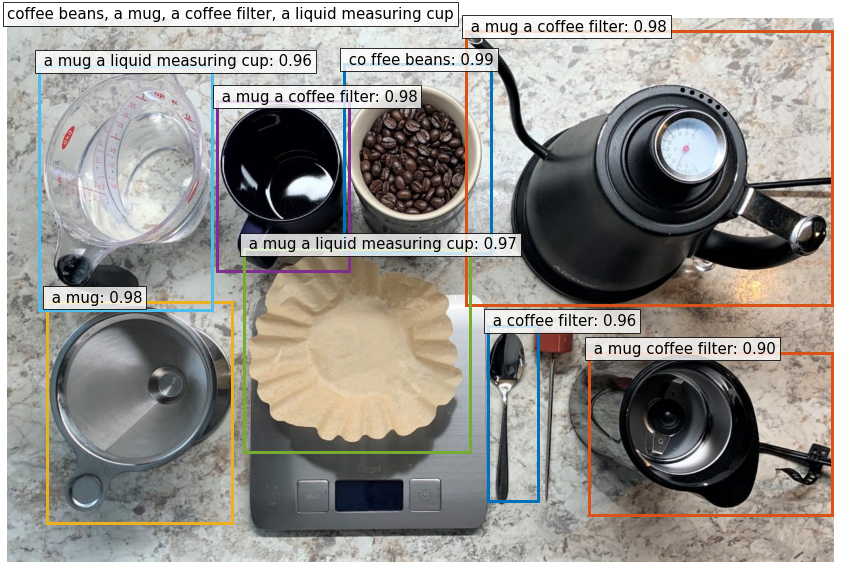

In [37]:
def draw_mdetr(img, caption, labels, scores, boxes, url=None):
    plt.figure(figsize=(16,10))
    im = np.array(img)
    H, W = im.shape[:2]
    ax = plt.gca()
    for i, (label, score, (xmin, ymin, xmax, ymax)) in enumerate(zip(labels, scores, boxes)):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, fill=False, color=cycle(colors, i), linewidth=3))
        ax.text(xmin, ymin, f'{label}: {score:0.2f}', fontsize=15, bbox=dict(facecolor='white', alpha=0.8))
    plt.imshow(im)
    ax.text(0, 0, caption, fontsize=15, bbox=dict(facecolor='white', alpha=0.8))
    plt.axis('off')
    if url:
        plt.savefig(f'outputs/{os.path.basename(url)}')
    plt.show()
draw_mdetr(img, caption, labels, scores, boxes)

In [90]:
pts = np.ones((100, 2))
xyz_pv = np.ones((300, 3))
dists = np.linalg.norm(pts[:,:2][:,None] - xyz_pv[:,:2][None], axis=-1)
closest = np.argmin(dists, axis=-1)
dists.shape, closest.shape

((), ())

## Batch

In [42]:
anns = {
    'cookbook/1-jelly-000.jpg': [
        'jar of smooth peanut butter',
        'jar of grape jelly',
        'a red cutting board',
        'green string',
        'a white tortilla',
        'a white plate',
        'five toothpicks',
        'a metal butter knife',
        'a paper napkin',
    ],
    'cookbook/1-jelly-001.jpg': [
        'a circular white tortilla on a red cutting board',
    ],
    'cookbook/1-jelly-002.jpg': [
        'a red cutting board',
        'a white tortilla',
        'smooth spread peanut butter',
        'a metal butter knife',
    ],
    'cookbook/1-jelly-003.jpg': [
        'a red cutting board',
        'a white tortilla',
        'smooth spread peanut butter',
        'a metal butter knife',
        'a paper napkin',
    ],
    'cookbook/1-jelly-004.jpg': [
        'a red cutting board',
        'a white tortilla',
        'spread jelly',
        'a metal butter knife',
    ],
    'cookbook/1-jelly-005.jpg': [
        'a red cutting board',
        'a white tortilla',
        'spread jelly',
        'a metal butter knife',
        'a paper napkin',
    ],
    'cookbook/1-jelly-005.jpg': [
        'a red cutting board',
        'a white tortilla',
        'spread jelly',
        'a metal butter knife',
        'a paper napkin',
    ],
    'cookbook/1-jelly-006.jpg': [
        'a red cutting board',
        'a white tortilla',
        'spread jelly',
    ],
    'cookbook/1-jelly-007.jpg': [
        'a red cutting board',
        'a rolled flour tortilla',
    ],
    'cookbook/1-jelly-008.jpg': [
        'a red cutting board',
        # 'a rolled flour tortilla',
        'five toothpicks sticking out of a rolled flour tortilla'
    ],
    'cookbook/1-jelly-009.jpg': [
        'a red cutting board',
        # 'a rolled flour tortilla',
        'five toothpicks sticking out of a rolled flour tortilla with its ends cut off'
    ],
    'cookbook/1-jelly-010.jpg': [
        'a red cutting board',
        # 'a rolled flour tortilla',
        'a rolled flour tortilla wrapped with green string',
    ],
    'cookbook/1-jelly-011.jpg': [
        'a red cutting board',
        # 'a rolled flour tortilla',
        'a rolled flour tortilla with 5 toothpicks sticking out',
        'a jelly tortilla roll',
        'green string',
    ],
    'cookbook/1-jelly-012.jpg': [
        'a red cutting board',
        # 'a rolled flour tortilla',
        'a rolled flour tortilla with 5 toothpicks sticking out',
        '3 jelly tortilla rolls',
    ],
    'cookbook/1-jelly-013.jpg': [
        'a white plate',
        'five jelly tortilla rolls with a toothpick sticking out each one'
    ],
}

In [76]:
def draw_iso(features):
    Xog = features[0].tensors
    X = np.transpose(Xog[0].detach().numpy(), (1, 2, 0)).reshape((-1, Xog.shape[1]))
    from sklearn.manifold import Isomap
    iso = Isomap(n_components=3)
    c = iso.fit_transform(X)
    c = (c - c.min()) / (c.max() - c.min())
    c = c.reshape(tuple(Xog.shape[-2:]) + (3,))
    plt.imshow(c)

In [77]:
@monkey(model.backbone)
def forward(fw, *a, **kw):
    y = fw(*a, **kw)
    model.backbone._last_features = y
    return y

cookbook/1-jelly-000.jpg jar of smooth peanut butter, jar of grape jelly, a red cutting board, green string, a white tortilla, a white plate, five toothpicks, a metal butter knife, a paper napkin
- - mask: Tensor[torch.Size([1, 16, 22])]
    tensors: Tensor[torch.Size([1, 512, 16, 22])]
- - Tensor[torch.Size([1, 256, 16, 22])]

transformer 0.1798388957977295
transformer 0.18681097030639648


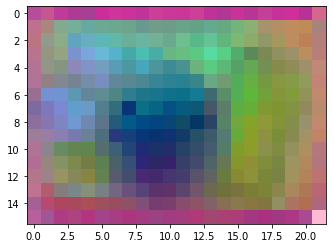

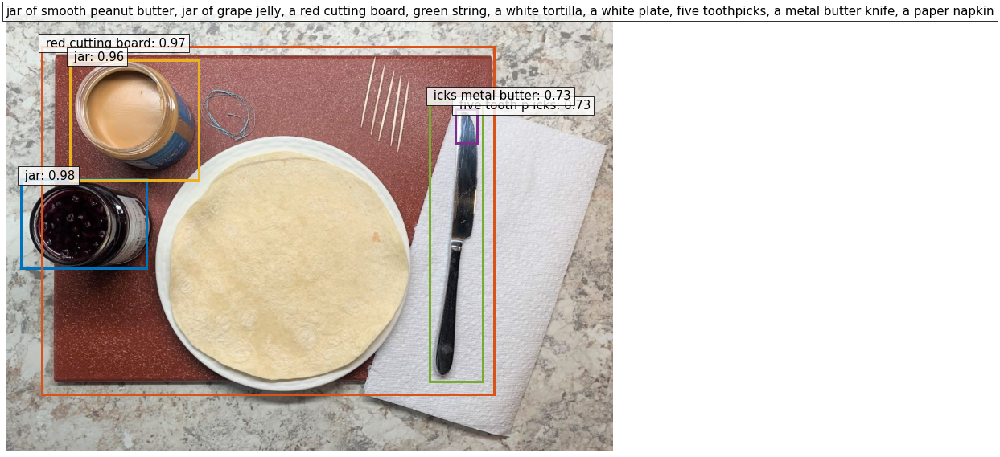

cookbook/1-jelly-001.jpg a circular white tortilla on a red cutting board


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 21])]
    tensors: Tensor[torch.Size([1, 512, 16, 21])]
- - Tensor[torch.Size([1, 256, 16, 21])]

transformer 0.17733287811279297
transformer 0.06314873695373535


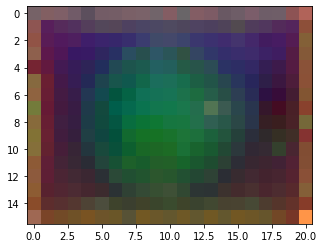

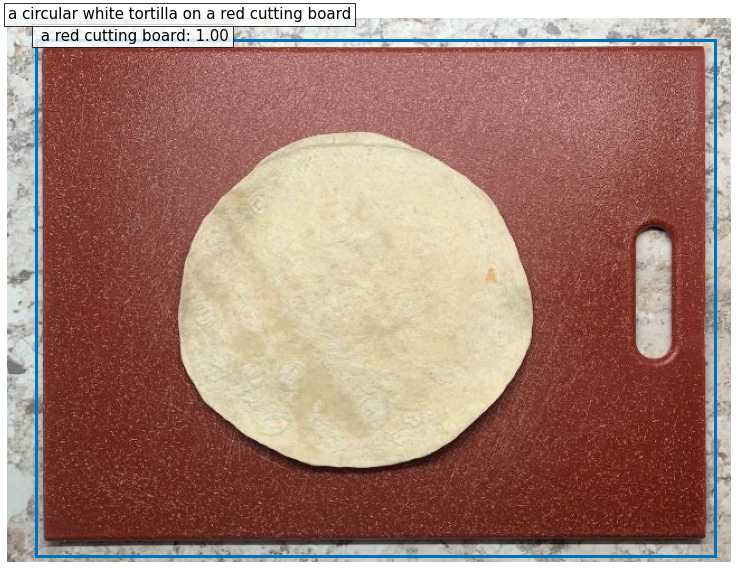

cookbook/1-jelly-002.jpg a red cutting board, a white tortilla, smooth spread peanut butter, a metal butter knife


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 20])]
    tensors: Tensor[torch.Size([1, 512, 16, 20])]
- - Tensor[torch.Size([1, 256, 16, 20])]

transformer 0.17686796188354492
transformer 0.07645678520202637


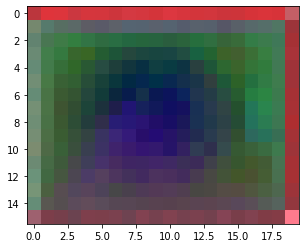

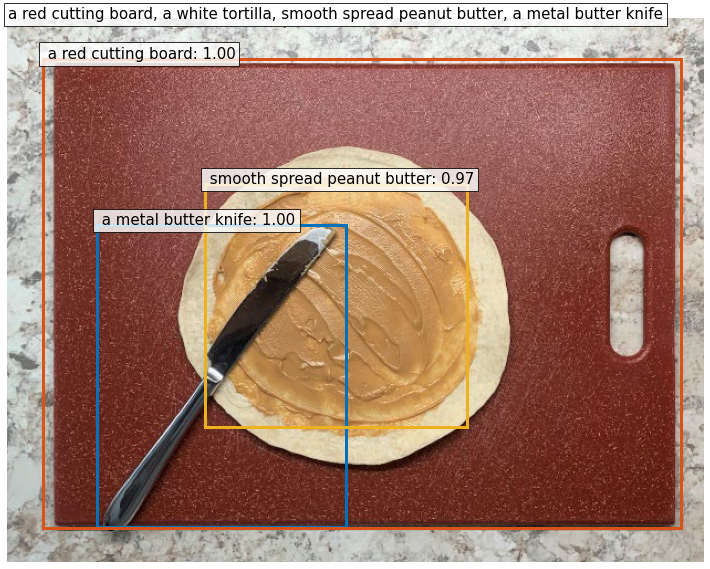

cookbook/1-jelly-003.jpg a red cutting board, a white tortilla, smooth spread peanut butter, a metal butter knife, a paper napkin


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 22])]
    tensors: Tensor[torch.Size([1, 512, 16, 22])]
- - Tensor[torch.Size([1, 256, 16, 22])]

transformer 0.14775705337524414
transformer 0.07103514671325684


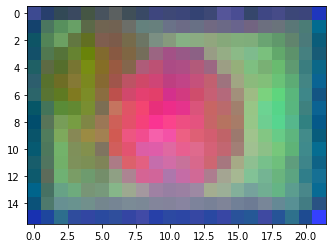

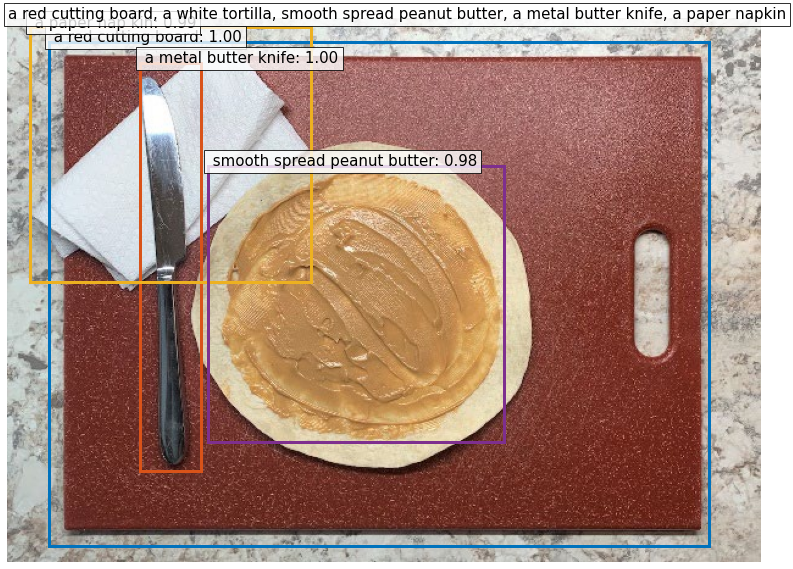

cookbook/1-jelly-004.jpg a red cutting board, a white tortilla, spread jelly, a metal butter knife


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 21])]
    tensors: Tensor[torch.Size([1, 512, 16, 21])]
- - Tensor[torch.Size([1, 256, 16, 21])]

transformer 0.2962808609008789
transformer 0.060443878173828125


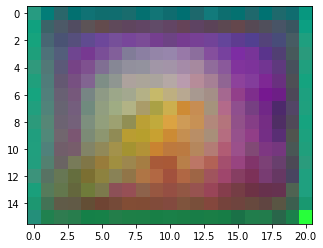

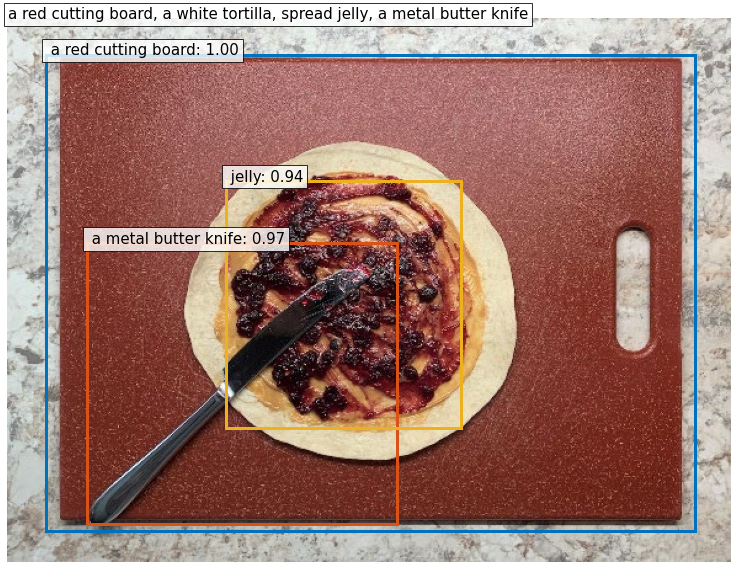

cookbook/1-jelly-005.jpg a red cutting board, a white tortilla, spread jelly, a metal butter knife, a paper napkin


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 22])]
    tensors: Tensor[torch.Size([1, 512, 16, 22])]
- - Tensor[torch.Size([1, 256, 16, 22])]

transformer 0.18011212348937988
transformer 0.0917661190032959


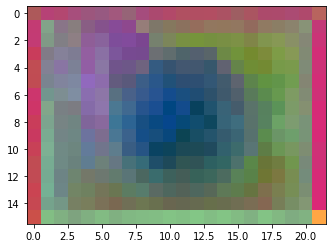

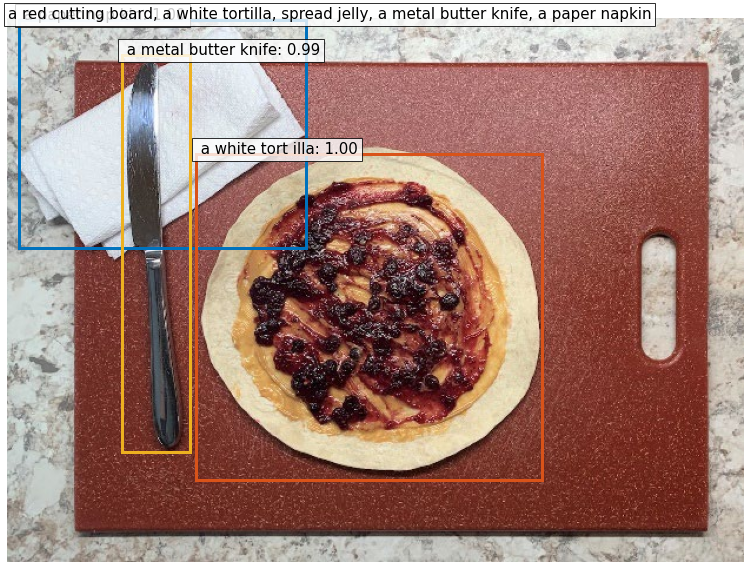

cookbook/1-jelly-006.jpg a red cutting board, a white tortilla, spread jelly


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 21])]
    tensors: Tensor[torch.Size([1, 512, 16, 21])]
- - Tensor[torch.Size([1, 256, 16, 21])]

transformer 0.1388092041015625
transformer 0.0585179328918457


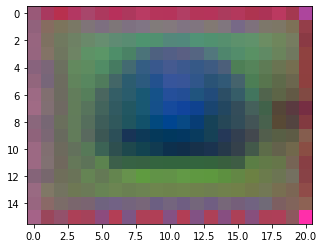

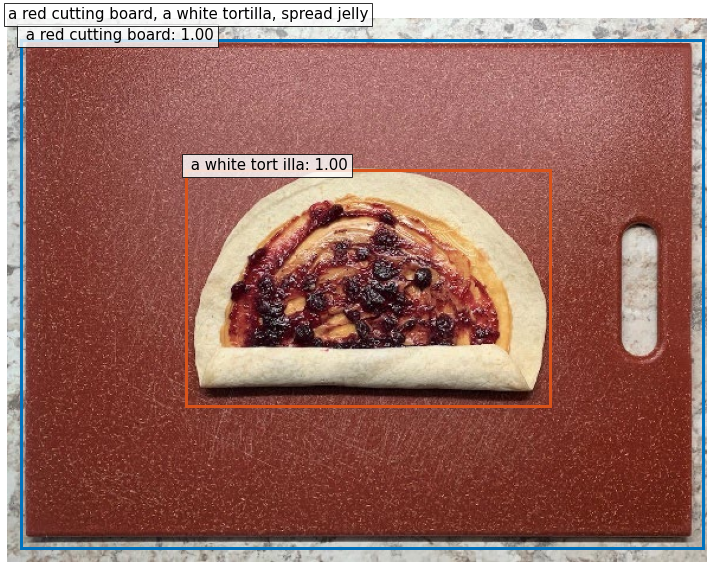

cookbook/1-jelly-007.jpg a red cutting board, a rolled flour tortilla


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 20])]
    tensors: Tensor[torch.Size([1, 512, 16, 20])]
- - Tensor[torch.Size([1, 256, 16, 20])]

transformer 0.18288516998291016
transformer 0.0808708667755127


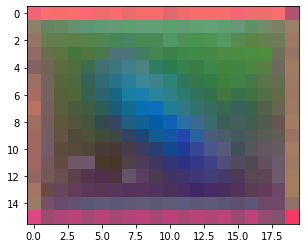

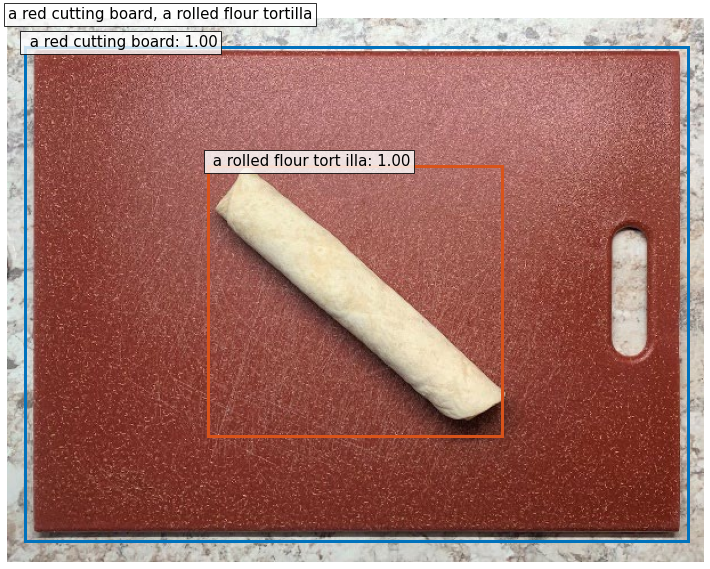

cookbook/1-jelly-008.jpg a red cutting board, five toothpicks sticking out of a rolled flour tortilla


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 21])]
    tensors: Tensor[torch.Size([1, 512, 16, 21])]
- - Tensor[torch.Size([1, 256, 16, 21])]

transformer 0.14459490776062012
transformer 0.09515500068664551


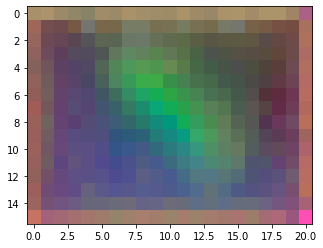

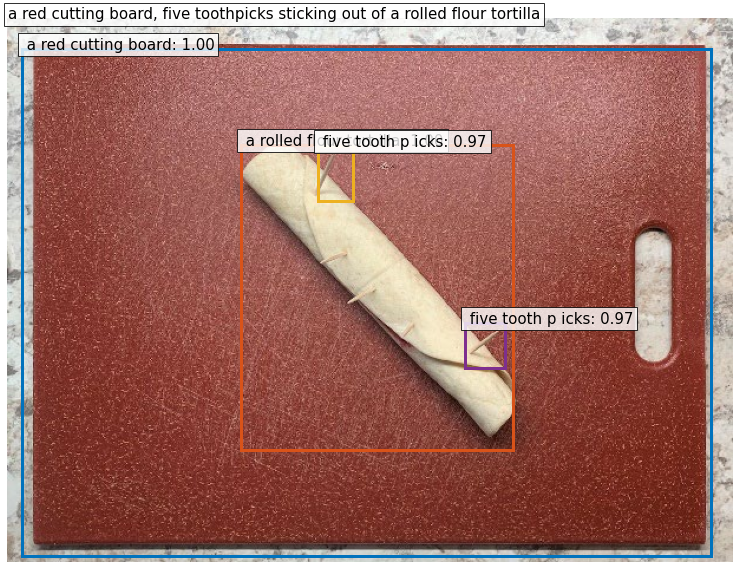

cookbook/1-jelly-009.jpg a red cutting board, five toothpicks sticking out of a rolled flour tortilla with its ends cut off


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 20])]
    tensors: Tensor[torch.Size([1, 512, 16, 20])]
- - Tensor[torch.Size([1, 256, 16, 20])]

transformer 0.24319100379943848
transformer 0.11338210105895996


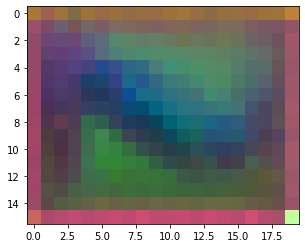

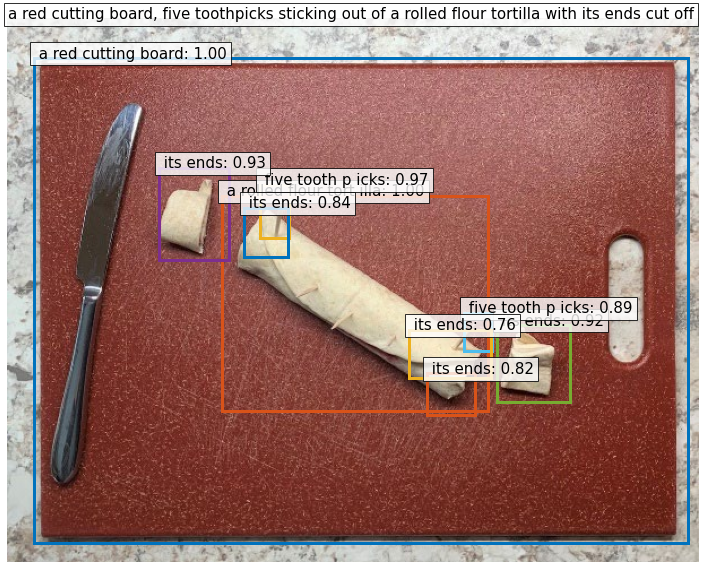

cookbook/1-jelly-010.jpg a red cutting board, a rolled flour tortilla wrapped with green string


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 22])]
    tensors: Tensor[torch.Size([1, 512, 16, 22])]
- - Tensor[torch.Size([1, 256, 16, 22])]

transformer 0.20702290534973145
transformer 0.07239890098571777


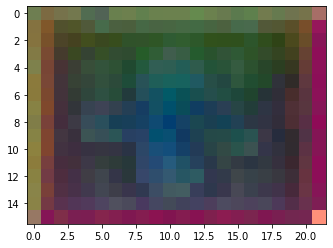

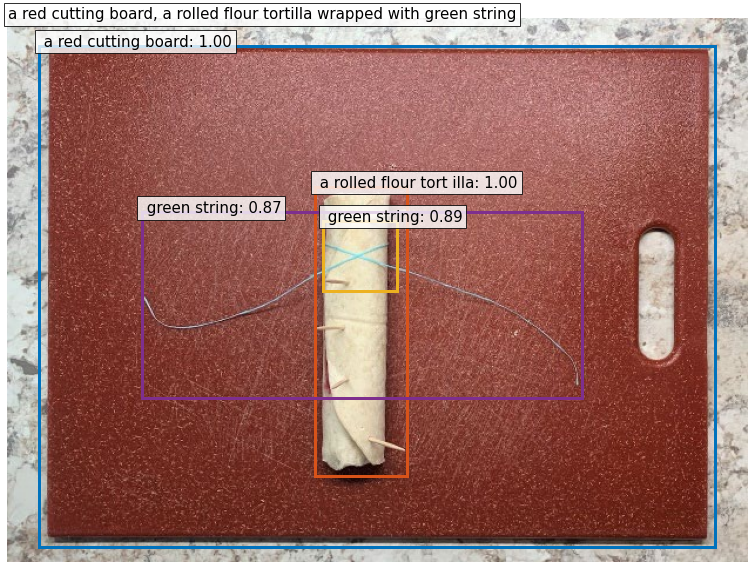

cookbook/1-jelly-011.jpg a red cutting board, a rolled flour tortilla with 5 toothpicks sticking out, a jelly tortilla roll, green string


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 21])]
    tensors: Tensor[torch.Size([1, 512, 16, 21])]
- - Tensor[torch.Size([1, 256, 16, 21])]

transformer 0.20214509963989258
transformer 0.09693121910095215


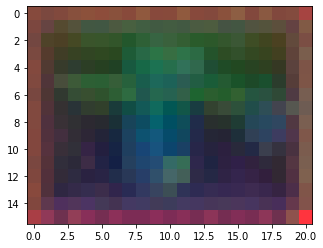

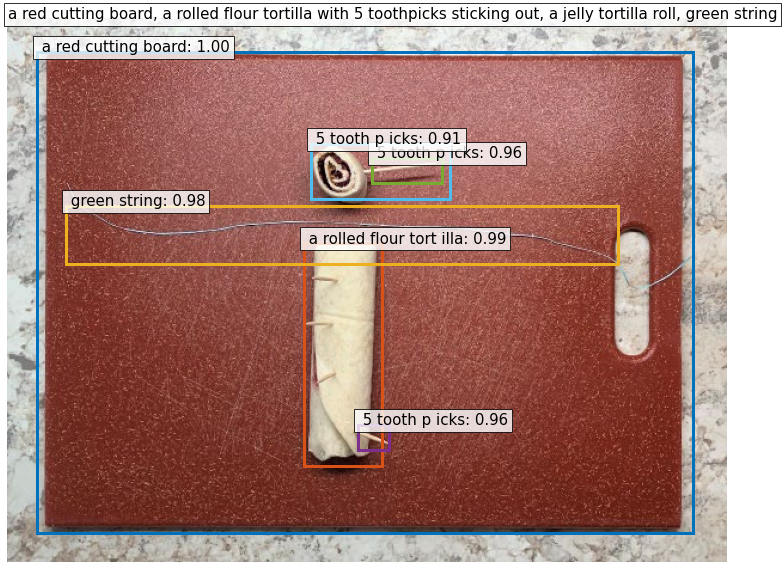

cookbook/1-jelly-012.jpg a red cutting board, a rolled flour tortilla with 5 toothpicks sticking out, 3 jelly tortilla rolls


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 21])]
    tensors: Tensor[torch.Size([1, 512, 16, 21])]
- - Tensor[torch.Size([1, 256, 16, 21])]

transformer 0.13380193710327148
transformer 0.06103706359863281


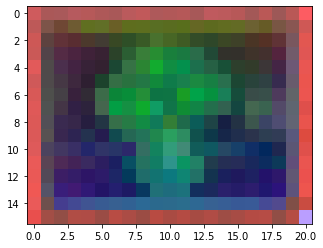

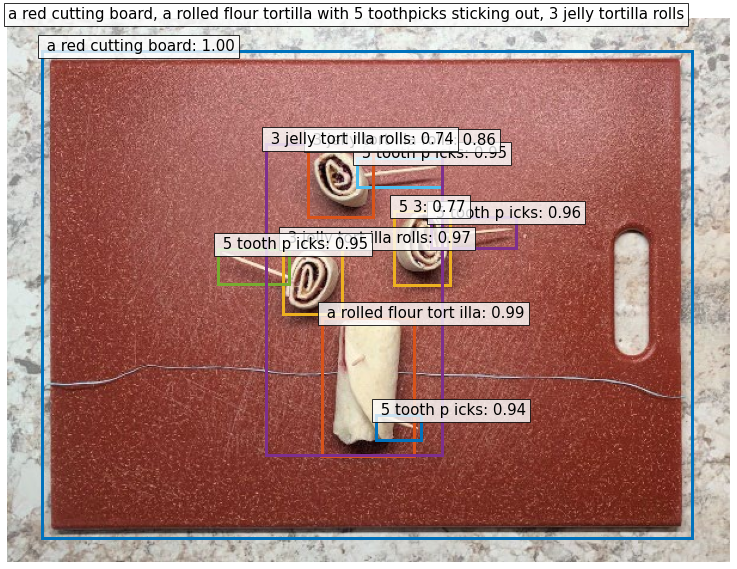

cookbook/1-jelly-013.jpg a white plate, five jelly tortilla rolls with a toothpick sticking out each one


/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


- - mask: Tensor[torch.Size([1, 16, 21])]
    tensors: Tensor[torch.Size([1, 512, 16, 21])]
- - Tensor[torch.Size([1, 256, 16, 21])]

transformer 0.14873027801513672
transformer 0.060597896575927734


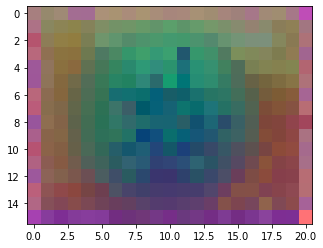

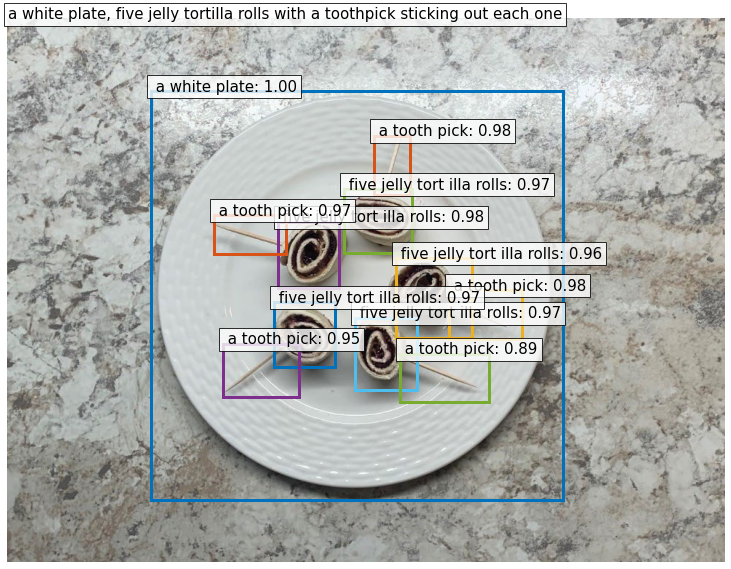

In [79]:
for f, objects in anns.items():
    caption = ', '.join(objects)
    print(f, caption)
    img = Image.open(f)
    X_img = transform(img).unsqueeze(0)
    memory_cache = model(X_img, [caption], encode_and_save=True)
    
    draw_iso(model.backbone._last_features[0])
    outputs = model(X_img, [caption], encode_and_save=False, memory_cache=memory_cache)
    probs, = postprocessor(outputs, torch.tensor([img.size[::-1]]))
    boxes, scores, labels = prepare(probs, outputs, caption, memory_cache)
    draw_mdetr(img, caption, labels, scores, boxes, url=f)

In [46]:
model.forward??

Signature:
model.forward(
    samples: util.misc.NestedTensor,
    captions,
    encode_and_save=True,
    memory_cache=None,
)
Source:   
    def forward(self, samples: NestedTensor, captions, encode_and_save=True, memory_cache=None):
        """The forward expects a NestedTensor, which consists of:
           - samples.tensor: batched images, of shape [batch_size x 3 x H x W]
           - samples.mask: a binary mask of shape [batch_size x H x W], containing 1 on padded pixels

        It returns a dict with the following elements:
           - "pred_logits": the classification logits (including no-object) for all queries.
                            Shape= [batch_size x num_queries x (num_classes + 1)]
           - "pred_boxes": The normalized boxes coordinates for all queries, represented as
                           (center_x, center_y, height, width). These values are normalized in [0, 1],
                           relative to the size of each individual image (disregarding poss

In [54]:
import models.mdetr
NestedTensor = models.mdetr.NestedTensor

In [56]:
features, pos = model.backbone(NestedTensor.from_tensor_list(X_img))

- - mask: Tensor[torch.Size([1, 16, 21])]
    tensors: Tensor[torch.Size([1, 512, 16, 21])]
- - Tensor[torch.Size([1, 256, 16, 21])]



/Users/beasteers/.cache/torch/hub/ashkamath_mdetr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


In [70]:
Xog = features[0].tensors
X = np.transpose(Xog[0].detach().numpy(), (1, 2, 0)).reshape((-1, Xog.shape[1]))
X.shape

(336, 512)

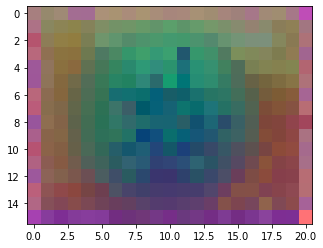

In [73]:
from sklearn.manifold import Isomap
iso = Isomap(n_components=3)
c = iso.fit_transform(X)
c = (c - c.min()) / (c.max() - c.min())
c = c.reshape(tuple(Xog.shape[-2:]) + (3,))
plt.imshow(c)

In [88]:
srcproj = model.input_proj(Xog)
srcproj.shape

torch.Size([1, 256, 16, 21])

In [60]:
features[0].tensors.shape

torch.Size([1, 512, 16, 21])

In [80]:
memory_cache['img_memory'].shape

torch.Size([355, 1, 256])

In [ ]:
c = c.reshape(tuple(Xog.shape[-2:]) + (3,))
c = iso.fit_transform(X)
c = (c - c.min()) / (c.max() - c.min())
c = c.reshape(tuple(Xog.shape[-2:]) + (3,))
plt.imshow(c)

In [85]:
355-16

339

In [82]:
memory_cache['text_memory_resized'].shape

torch.Size([19, 1, 256])

# annotation

In [41]:
from jupyter_bbox_widget import BBoxWidget
widget = BBoxWidget(
    image=url,
    classes=['liquid measuring cup', 'coffee filter', 'digital scale', 'spoon', 'coffee beans'],
)
widget

BBoxWidget(classes=['liquid measuring cup', 'coffee filter', 'digital scale', 'spoon', 'coffee beans'], colors…

In [40]:
url

'cookbook/2-coffee-014.jpg'

In [251]:
from torchinfo import summary
summary(model, input_size=[(16, 3, 800, 1200), (16, 1)])

RuntimeError: Failed to run torchinfo. See above stack traces for more details. Executed layers up to: [EfficientNetFeatures: 3, Conv2dSame: 4, FrozenBatchNorm2d: 4, SiLU: 4, Sequential: 5, DepthwiseSeparableConv: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, Identity: 7, DepthwiseSeparableConv: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, Identity: 7, DepthwiseSeparableConv: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, Identity: 7, Sequential: 5, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2dSame: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, Sequential: 5, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2dSame: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, Sequential: 5, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2dSame: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, Sequential: 5, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, Sequential: 5, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2dSame: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, Sequential: 5, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7, InvertedResidual: 6, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, Conv2d: 7, FrozenBatchNorm2d: 7, SiLU: 7, SqueezeExcite: 7, Conv2d: 8, SiLU: 8, Conv2d: 8, Sigmoid: 8, Conv2d: 7, FrozenBatchNorm2d: 7]

In [8]:
for name, l in model.named_children():
    print(name)

transformer
class_embed
bbox_embed
query_embed
input_proj
backbone
contrastive_align_projection_image
contrastive_align_projection_text


In [10]:
model.backbone

Joiner(
  (0): TimmBackbone(
    (body): EfficientNetFeatures(
      (conv_stem): Conv2dSame(3, 48, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn1): FrozenBatchNorm2d()
      (act1): SiLU(inplace=True)
      (blocks): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
            (conv_dw): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=48, bias=False)
            (bn1): FrozenBatchNorm2d()
            (act1): SiLU(inplace=True)
            (se): SqueezeExcite(
              (conv_reduce): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
              (act1): SiLU(inplace=True)
              (conv_expand): Conv2d(12, 48, kernel_size=(1, 1), stride=(1, 1))
              (gate): Sigmoid()
            )
            (conv_pw): Conv2d(48, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn2): FrozenBatchNorm2d()
            (act2): Identity()
          )
          (1): DepthwiseSeparableConv(
            (conv_dw)